# Object detection with YOLOv5

In this notebook I assamble a dataset and train a custom YOLOv5 model to recognise Voi e-scooters parked in the streets of Milan.

To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work


# EDA


In [2]:
# connecting with google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
# importing packages
import numpy as np
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [5]:
# loading CSV (bad parking % in Milan) - February to June
df = pd.read_csv('/bad_parking_rate_2022-06-26T10_04_36.577185Z.csv')

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139 entries, 0 to 138
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   RIDE_DATE  139 non-null    object 
 1   N_TOTAL    139 non-null    int64  
 2   N_BAD      139 non-null    int64  
 3   BAD_RATE   139 non-null    float64
dtypes: float64(1), int64(2), object(1)
memory usage: 4.5+ KB


In [7]:
df.head()

,RIDE_DATE,N_TOTAL,N_BAD,BAD_RATE
0,2022-02-23,1055,780,0.739336
1,2022-05-08,1365,1089,0.797802
2,2022-06-13,1397,946,0.677165
3,2022-06-14,1462,1005,0.687415
4,2022-02-27,1064,772,0.725564


In [9]:
df.shape

(139, 4)

In [12]:
df.dtypes

RIDE_DATE     object
N_TOTAL        int64
N_BAD          int64
BAD_RATE     float64
dtype: object

In [13]:
df.count()

RIDE_DATE    139
N_TOTAL      139
N_BAD        139
BAD_RATE     139
dtype: int64

In [14]:
df.describe()

,N_TOTAL,N_BAD,BAD_RATE
count,139.000000,139.000000,139.000000
mean,1222.683453,840.438849,0.684248
std,353.912030,339.824829,0.166038
min,353.000000,0.000000,0.000000
25%,976.500000,677.500000,0.696781
50%,1142.000000,808.000000,0.733333
75%,1445.500000,1076.000000,0.760347
max,2171.000000,1695.000000,0.821777


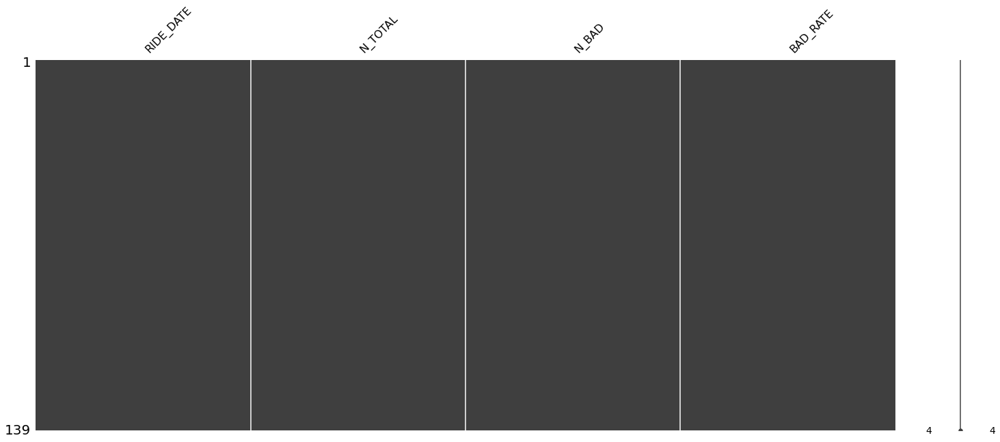

In [16]:
# visualizing missing data
import missingno as msno
msno.matrix(df)

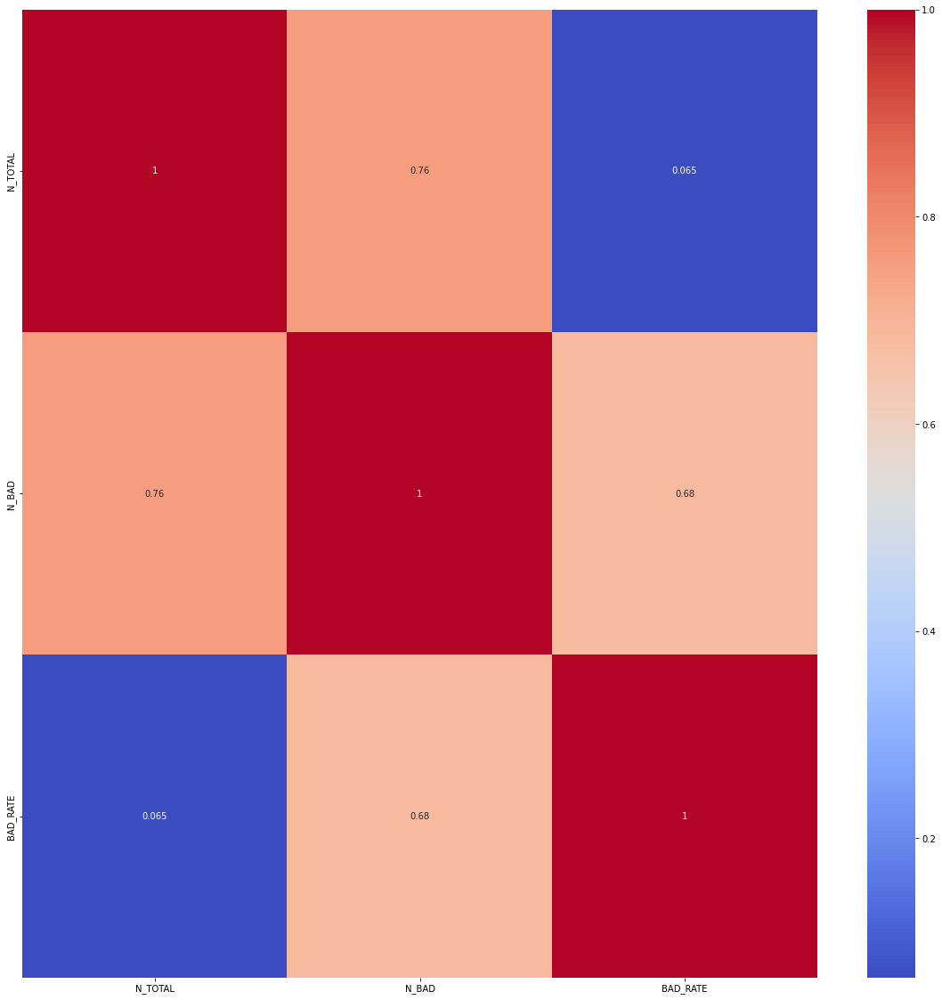

In [19]:
# plotting correlation matrix
corrMatrix = df.corr()
pyplot.figure(figsize=(20, 20))
sns.heatmap(corrMatrix, annot = True, cmap= 'coolwarm')

In [24]:
# calculating bad_rate mean
df["BAD_RATE"].mean()

0.6842479568345324

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


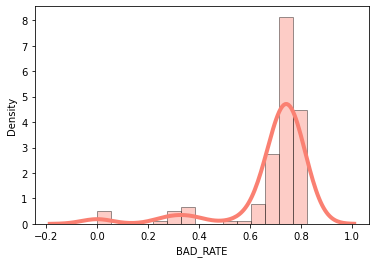

In [26]:
# plotting bad_rate distribution
sns.distplot(df["BAD_RATE"], hist=True, kde=True, 
             bins=int(15), color = 'salmon', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

# Install Requirements for YoloV5

In [2]:
# clone YOLOv5

!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12281, done.
remote: Total 12281 (delta 0), reused 0 (delta 0), pack-reused 12281
Receiving objects: 100% (12281/12281), 12.06 MiB | 20.09 MiB/s, done.
Resolving deltas: 100% (8475/8475), done.
/content/yolov5
     |████████████████████████████████| 596 kB 7.8 MB/s 
     |████████████████████████████████| 145 kB 7.4 MB/s 
     |████████████████████████████████| 178 kB 63.6 MB/s 
     |████████████████████████████████| 1.1 MB 62.8 MB/s 
     |████████████████████████████████| 67 kB 7.3 MB/s 
     |████████████████████████████████| 54 kB 3.3 MB/s 
     |████████████████████████████████| 138 kB 75.0 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.0 which is incompatible.
datasci

# Assemble Our Dataset

In order to train this custom model, I assembled a dataset of representative images with bounding box annotations and then transform it to YOLOv5 format.

In order to to this, and I've extract a non-labelled dataset of > 760 images, collected from snowflake db, and label them using Roboflow.

So I've uploaded raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

I’ve annotate them with 4 different labels:

*  rack_bicycle
*  rack_general
*  scooter
*  whitelines




In [3]:
!pip install roboflow # install roboflow

from roboflow import Roboflow # importing Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [5]:
# get labelled images from Roboflow workspace with Roboflow api_key

rf = Roboflow(api_key="5CqZFxkRl27JKRrT76fJ")
project = rf.workspace("voi-mkm9n").project("voi---finalproject")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Voi---FinalProject-3 in yolov5pytorch:: 100%|██████████| 3648/3648 [00:03<00:00, 1208.62it/s]


In [6]:
# this is the YAML file Roboflow wrote that I'm loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- rack_bicycle
- rack_general
- scooter
- whitelines
nc: 4
train: /content/datasets/Voi---FinalProject-3/train/images
val: /content/datasets/Voi---FinalProject-3/valid/images


In [7]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [8]:
# model configuratrion (default)
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [9]:
#customize iPython writefile to write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [10]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Our YOLOv5 model

Here, I need to pass Yolov5 arguments in order to train the model:

- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs.
- **data:** Our dataset location is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here I choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [11]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 300 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=, data=/content/datasets/Voi---FinalProject-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-261-g19f33cb Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_g

# Evaluate Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

In [12]:
# Start tensorboard
# Launch after started training
# Logs save in the folder "runs"
# mAP (mean average precision)

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [18]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Voi---FinalProject-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-261-g19f33cb Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7020913 parameters, 0 gradients
image 1/78 /content/datasets/Voi---FinalProject-3/test/images/075aecec-2c70-4f5d-aa29-08587c734257_lfq5_b752e463-fde8-468e-afcc-c00ac477669a_jpeg.rf.8f177b82fde6b3be6d6f806562d91195.jpg: 416x416 1 scooter, Done. (0.010s)
image 2/78 /content/datasets/Voi---FinalProject-3/test/images/07d73716-fdb6-483b-a329-b5c202f0783c_vmj9_b4c3ad30-3e75-4d74

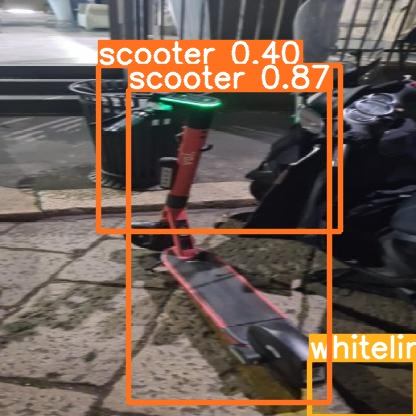

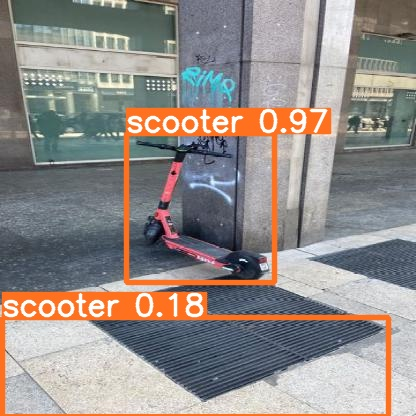

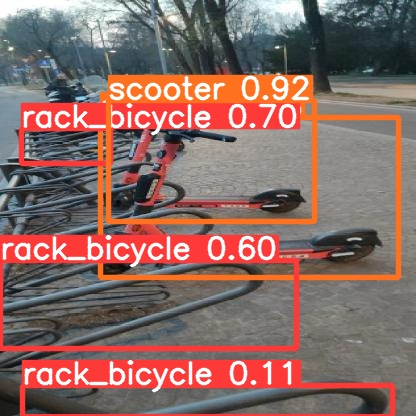

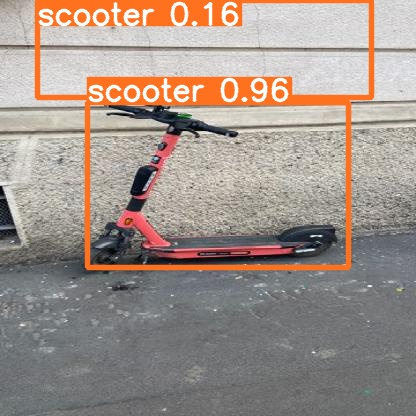

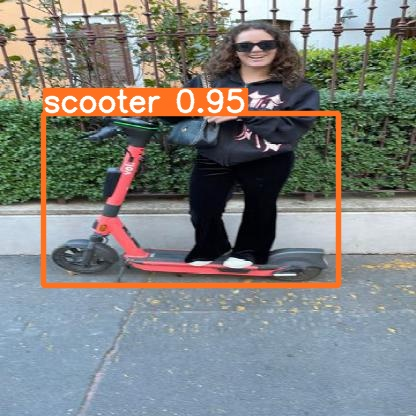

...

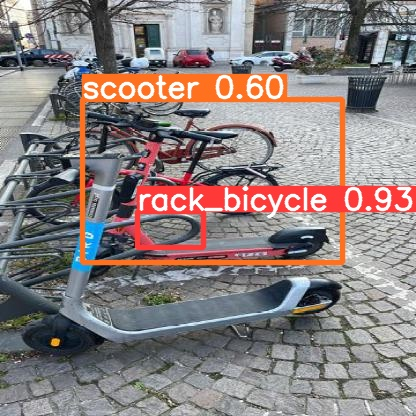

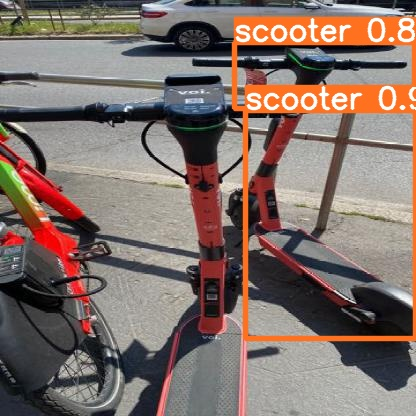

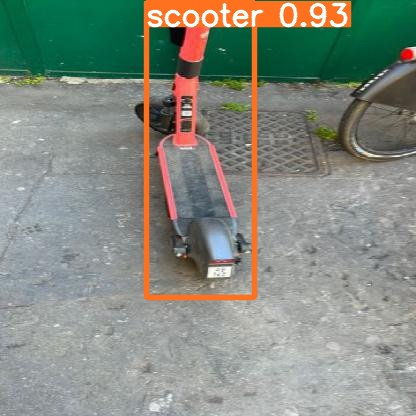

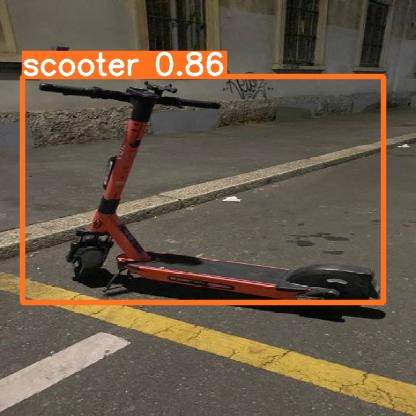

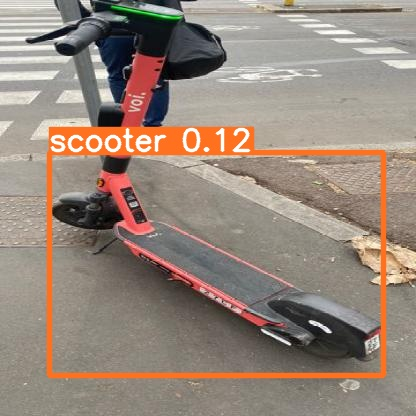

In [19]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Final Steps

In [20]:
#export model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

cp: cannot stat '/content/yolov5/runs/train/yolov5s_results/weights/best.pt': No such file or directory
